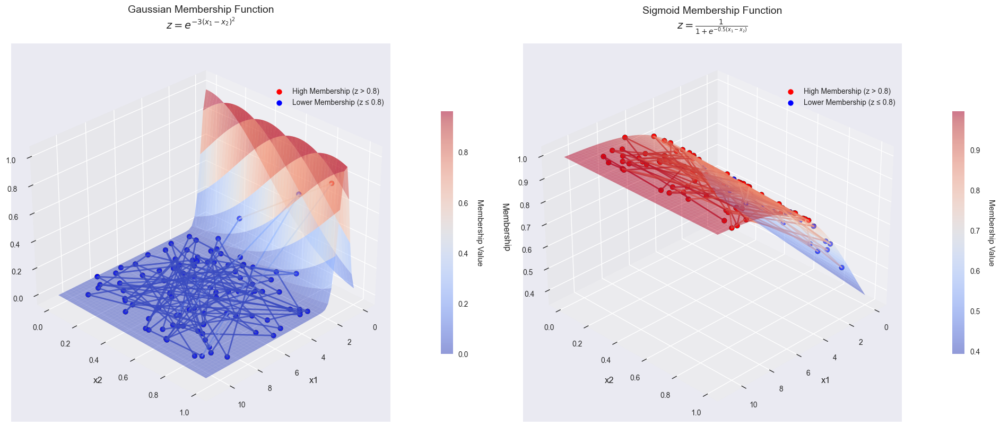

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm'] 
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def visualize_functions(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize Gaussian and Sigmoid functions in 3D space."""
    # Input validation
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 10), dpi=100)
    
    ax1 = fig.add_subplot(121, projection='3d')
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    z_A = np.exp(-3 * (x1_A - x2_A)**2)
    
    X1_A, X2_A = create_grid(x1_A, x2_A)
    Z_A = np.exp(-3 * (X1_A - X2_A)**2)
    
    
    surf_A, _ = plot_function(
        ax1, x1_A, x2_A, z_A, X1_A, X2_A, Z_A,
        'Gaussian Membership Function\n$z = e^{-3(x_1-x_2)^2}$'
    )
    
    cbar1 = fig.colorbar(surf_A, ax=ax1, shrink=0.5, pad=0.1)
    cbar1.set_label('Membership Value', rotation=270, labelpad=20)
    
    ax2 = fig.add_subplot(122, projection='3d')
    
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    z_B = 1 / (1 + np.exp(-0.5 * (x1_B - x2_B)))

    X1_B, X2_B = create_grid(x1_B, x2_B)
    Z_B = 1 / (1 + np.exp(-0.5 * (X1_B - X2_B)))
    
    surf_B, _ = plot_function(
        ax2, x1_B, x2_B, z_B, X1_B, X2_B, Z_B,
        'Sigmoid Membership Function\n$z = \\frac{1}{1+e^{-0.5(x_1-x_2)}}$'
    )
    
    cbar2 = fig.colorbar(surf_B, ax=ax2, shrink=0.5, pad=0.1)
    cbar2.set_label('Membership Value', rotation=270, labelpad=20)
    
    for ax in [ax1, ax2]:
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('membership_function_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)  
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_functions(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

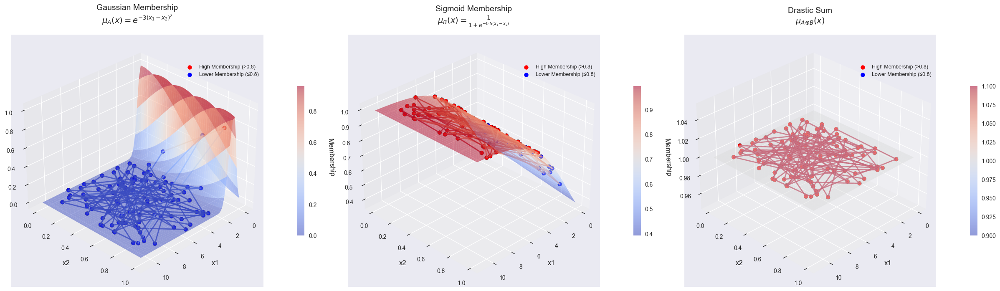

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm']
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    # Customize axes
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def calculate_membership(x1: np.ndarray, x2: np.ndarray, func_type: str) -> np.ndarray:
    """Calculate membership values based on function type."""
    if func_type == 'gaussian':
        return np.exp(-3 * (x1 - x2)**2)
    elif func_type == 'sigmoid':
        return 1 / (1 + np.exp(-0.5 * (x1 - x2)))
    else:
        raise ValueError("Unknown function type")

def drastic_sum(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    """
    Calculate drastic sum of two fuzzy sets.
    μ_A⊕B(x) = max(μ_A(x), μ_B(x)) if min(μ_A(x), μ_B(x)) == 0
                1 otherwise
    """
    return np.where((a == 0) | (b == 0), np.maximum(a, b), 1.0)

def visualize_functions(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize original functions and their drastic sum in 3D space."""
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(25, 8), dpi=100)
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    
    z_A = calculate_membership(x1_A, x2_A, 'gaussian')
    z_B = calculate_membership(x1_B, x2_B, 'sigmoid')
    
    X1, X2 = create_grid(x1_A, x2_A)
    
    Z_A = calculate_membership(X1, X2, 'gaussian')
    Z_B = calculate_membership(X1, X2, 'sigmoid')
    Z_drastic = drastic_sum(Z_A, Z_B)
    
    ax1 = fig.add_subplot(131, projection='3d')
    surf_A, _ = plot_function(
        ax1, x1_A, x2_A, z_A, X1, X2, Z_A,
        'Gaussian Membership\n$μ_A(x) = e^{-3(x_1-x_2)^2}$'
    )
    fig.colorbar(surf_A, ax=ax1, shrink=0.5, pad=0.1)
    
    ax2 = fig.add_subplot(132, projection='3d')
    surf_B, _ = plot_function(
        ax2, x1_B, x2_B, z_B, X1, X2, Z_B,
        'Sigmoid Membership\n$μ_B(x) = \\frac{1}{1+e^{-0.5(x_1-x_2)}}$'
    )
    fig.colorbar(surf_B, ax=ax2, shrink=0.5, pad=0.1)
    
    ax3 = fig.add_subplot(133, projection='3d')
    z_drastic = drastic_sum(z_A, z_B)
    surf_drastic, _ = plot_function(
        ax3, x1_A, x2_A, z_drastic, X1, X2, Z_drastic,
        'Drastic Sum\n$μ_{A⊕B}(x)$'
    )
    fig.colorbar(surf_drastic, ax=ax3, shrink=0.5, pad=0.1)
    
    for ax in [ax1, ax2, ax3]:
        ax.scatter([], [], c='red', label='High Membership (>0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (≤0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=9)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('drastic_sum_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_functions(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

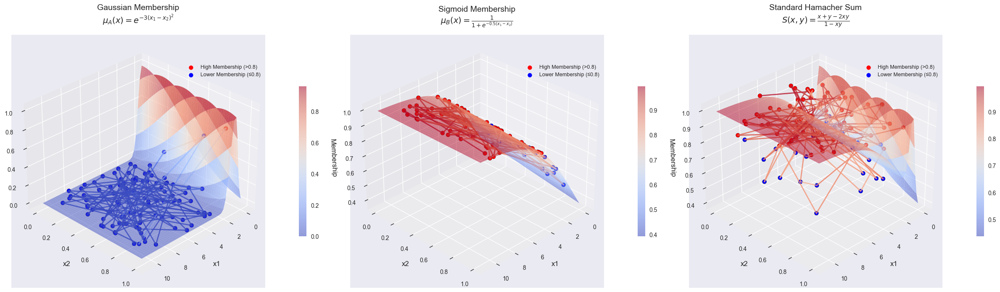

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm']
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def calculate_membership(x1: np.ndarray, x2: np.ndarray, func_type: str) -> np.ndarray:
    """Calculate membership values based on function type."""
    if func_type == 'gaussian':
        return np.exp(-3 * (x1 - x2)**2)
    elif func_type == 'sigmoid':
        return 1 / (1 + np.exp(-0.5 * (x1 - x2)))
    else:
        raise ValueError("Unknown function type")

def standard_hamacher_sum(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    """
    Calculate standard Hamacher sum (T-conorm) of two fuzzy sets.
    S(x,y) = (x + y - 2xy)/(1 - xy)
    
    Special cases:
    - When x=0: S(0,y) = y
    - When y=0: S(x,0) = x
    - When x=1 or y=1: S(x,1) = S(1,y) = 1
    """
    numerator = a + b - 2*a*b
    denominator = 1 - a*b
    return np.where(denominator == 0, 1.0, numerator / denominator)

def visualize_functions(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize original functions and their Hamacher sum in 3D space."""
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(25, 8), dpi=100)
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    
    z_A = calculate_membership(x1_A, x2_A, 'gaussian')
    z_B = calculate_membership(x1_B, x2_B, 'sigmoid')
    
    X1, X2 = create_grid(x1_A, x2_A)
    
    Z_A = calculate_membership(X1, X2, 'gaussian')
    Z_B = calculate_membership(X1, X2, 'sigmoid')
    Z_hamacher = standard_hamacher_sum(Z_A, Z_B)
    
    # Plot Gaussian (Left)
    ax1 = fig.add_subplot(131, projection='3d')
    surf_A, _ = plot_function(
        ax1, x1_A, x2_A, z_A, X1, X2, Z_A,
        'Gaussian Membership\n$μ_A(x) = e^{-3(x_1-x_2)^2}$'
    )
    fig.colorbar(surf_A, ax=ax1, shrink=0.5, pad=0.1)
    
    # Plot Sigmoid (Middle)
    ax2 = fig.add_subplot(132, projection='3d')
    surf_B, _ = plot_function(
        ax2, x1_B, x2_B, z_B, X1, X2, Z_B,
        'Sigmoid Membership\n$μ_B(x) = \\frac{1}{1+e^{-0.5(x_1-x_2)}}$'
    )
    fig.colorbar(surf_B, ax=ax2, shrink=0.5, pad=0.1)
    
    ax3 = fig.add_subplot(133, projection='3d')
    z_hamacher = standard_hamacher_sum(z_A, z_B)
    surf_hamacher, _ = plot_function(
        ax3, x1_A, x2_A, z_hamacher, X1, X2, Z_hamacher,
        'Standard Hamacher Sum\n$S(x,y) = \\frac{x + y - 2xy}{1 - xy}$'
    )
    fig.colorbar(surf_hamacher, ax=ax3, shrink=0.5, pad=0.1)
    
    # Add legends
    for ax in [ax1, ax2, ax3]:
        ax.scatter([], [], c='red', label='High Membership (>0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (≤0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=9)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('standard_hamacher_sum_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_functions(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

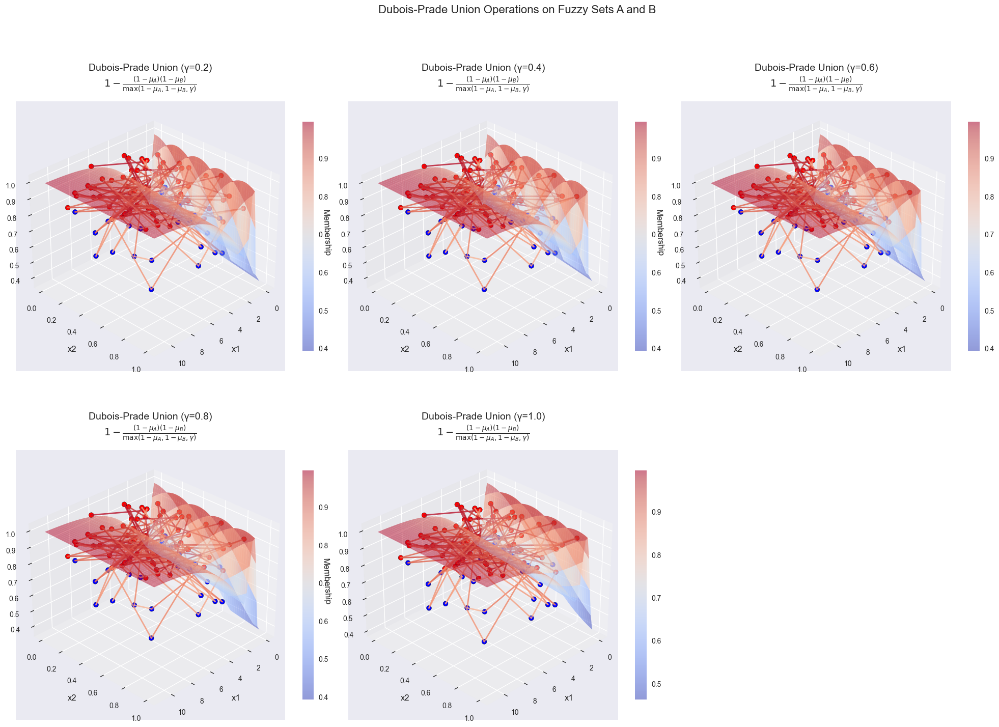

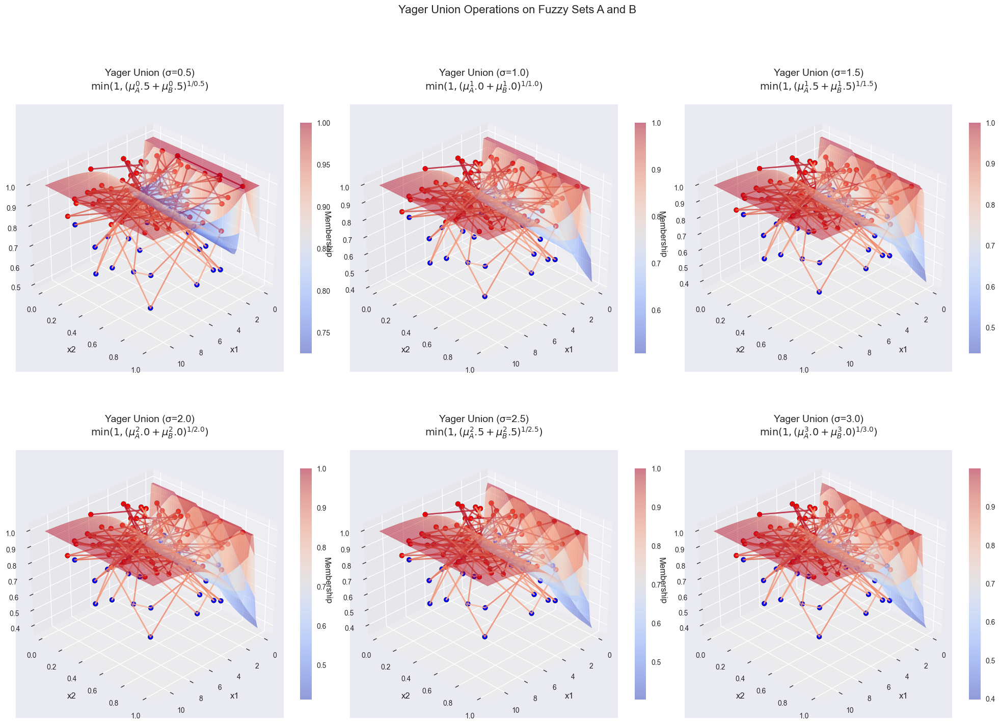


Effect of Parameters on Union Operations:

Dubois-Prade (γ):
- γ→0: Approaches algebraic sum (probabilistic sum)
- γ=1: Becomes maximum operator s(x,y) = max(x,y)

Yager (σ):
- σ→0: Approaches maximum operator
- σ=1: Becomes bounded sum min(1, x+y)
- σ→∞: Approaches drastic union (1 if x or y > 0)


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm']
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def calculate_membership(x1: np.ndarray, x2: np.ndarray, func_type: str) -> np.ndarray:
    """Calculate membership values based on function type."""
    if func_type == 'gaussian':
        return np.exp(-3 * (x1 - x2)**2)
    elif func_type == 'sigmoid':
        return 1 / (1 + np.exp(-0.5 * (x1 - x2)))
    else:
        raise ValueError("Unknown function type")

def dubois_prade_snorm(a: np.ndarray, b: np.ndarray, gamma: float) -> np.ndarray:
    """
    Dubois-Prade S-norm (Union operation):
    s_γ[a,b] = 1 - ( (1-a)(1-b) ) / max(1-a, 1-b, γ)
    γ ∈ [0,1]
    """
    one_minus_a = 1 - a
    one_minus_b = 1 - b
    denominator = np.maximum(np.maximum(one_minus_a, one_minus_b), gamma)
    return 1 - (one_minus_a * one_minus_b) / np.where(denominator == 0, 1e-10, denominator)

def yager_snorm(a: np.ndarray, b: np.ndarray, sigma: float) -> np.ndarray:
    """
    Yager S-norm (Union operation):
    s_σ[a,b] = min(1, (a^σ + b^σ)^(1/σ))
    σ ∈ (0,∞)
    """
    if sigma == 0:
        return np.maximum(a, b)
    return np.minimum(1, (a**sigma + b**sigma)**(1/sigma))

def visualize_operations(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize original sets and their union operations."""
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    
    z_A = calculate_membership(x1_A, x2_A, 'gaussian')
    z_B = calculate_membership(x1_B, x2_B, 'sigmoid')
    
    X1, X2 = create_grid(x1_A, x2_A)
    
    Z_A = calculate_membership(X1, X2, 'gaussian')
    Z_B = calculate_membership(X1, X2, 'sigmoid')
    
    dp_gammas = [0.2, 0.4, 0.6, 0.8, 1.0]
    yager_sigmas = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
    
    fig1 = plt.figure(figsize=(20, 15))
    fig1.suptitle('Dubois-Prade Union Operations on Fuzzy Sets A and B', fontsize=16, y=1.02)
    
    for i, gamma in enumerate(dp_gammas, 1):
        ax = fig1.add_subplot(2, 3, i, projection='3d')
        Z_dp = dubois_prade_snorm(Z_A, Z_B, gamma)
        z_dp = dubois_prade_snorm(z_A, z_B, gamma)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_dp, X1, X2, Z_dp,
            f'Dubois-Prade Union (γ={gamma})\n$1-\\frac{{(1-μ_A)(1-μ_B)}}{{\\max(1-μ_A,1-μ_B,γ)}}$'
        )
        fig1.colorbar(surf, ax=ax, shrink=0.6)
    
    plt.tight_layout()
    
    fig2 = plt.figure(figsize=(20, 15))
    fig2.suptitle('Yager Union Operations on Fuzzy Sets A and B', fontsize=16, y=1.02)
    
    for i, sigma in enumerate(yager_sigmas, 1):
        ax = fig2.add_subplot(2, 3, i, projection='3d')
        Z_yager = yager_snorm(Z_A, Z_B, sigma)
        z_yager = yager_snorm(z_A, z_B, sigma)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_yager, X1, X2, Z_yager,
            f'Yager Union (σ={sigma})\n$\\min(1,(μ_A^{sigma}+μ_B^{sigma})^{{1/{sigma}}})$'
        )
        fig2.colorbar(surf, ax=ax, shrink=0.6)
    
    plt.tight_layout()
    plt.show()
    
    print("\nEffect of Parameters on Union Operations:")
    print("\nDubois-Prade (γ):")
    print("- γ→0: Approaches algebraic sum (probabilistic sum)")
    print("- γ=1: Becomes maximum operator s(x,y) = max(x,y)")
    
    print("\nYager (σ):")
    print("- σ→0: Approaches maximum operator")
    print("- σ=1: Becomes bounded sum min(1, x+y)")
    print("- σ→∞: Approaches drastic union (1 if x or y > 0)")

if __name__ == "__main__":
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_operations(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

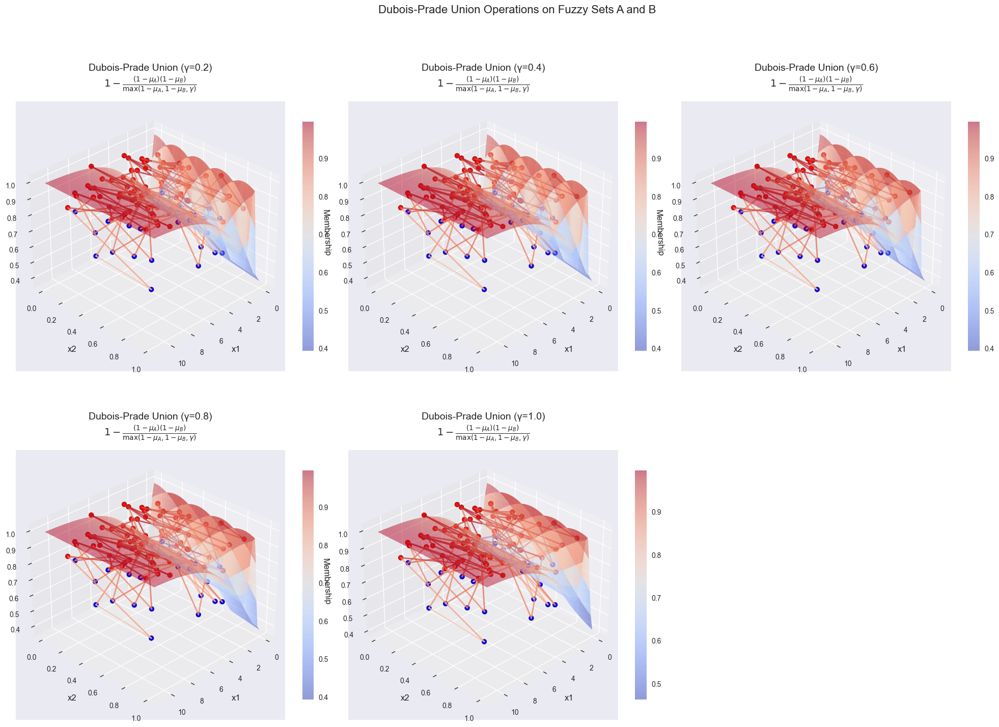

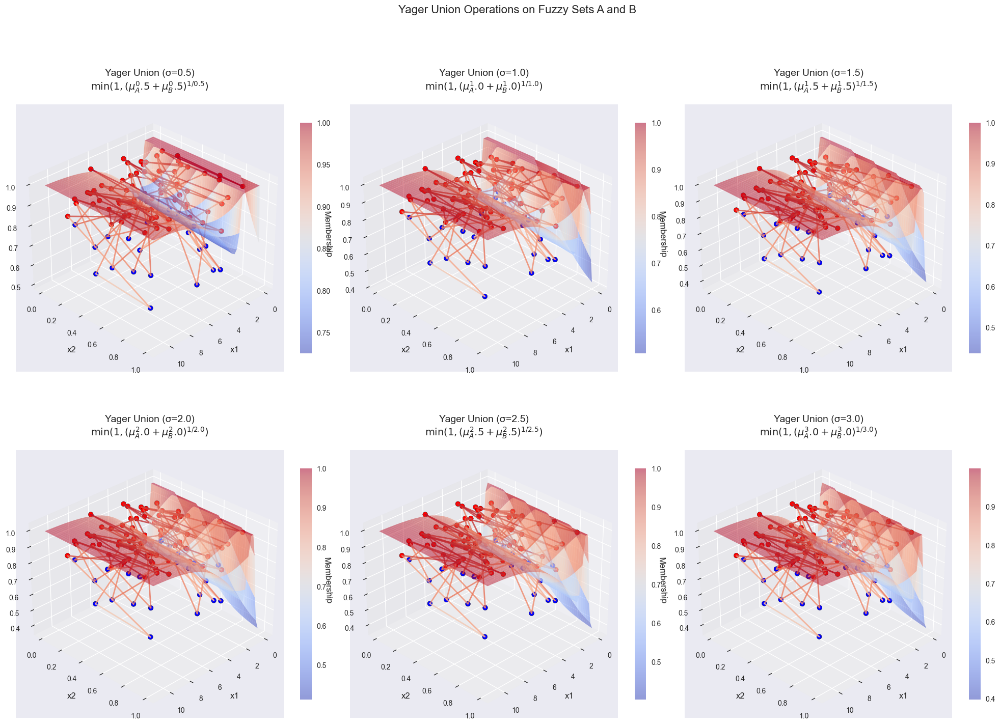

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm']
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    sort_idx = np.argsort(x1)
    x1_sorted = x1[sort_idx]
    x2_sorted = x2[sort_idx]
    z_sorted = z[sort_idx]
    for i in range(len(x1_sorted)-1):
        ax.plot(x1_sorted[i:i+2], x2_sorted[i:i+2], z_sorted[i:i+2], 
                color=cmap((z_sorted[i]+z_sorted[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def calculate_membership(x1: np.ndarray, x2: np.ndarray, func_type: str) -> np.ndarray:
    """Calculate membership values based on function type."""
    if func_type == 'gaussian':
        return np.exp(-3 * (x1 - x2)**2)
    elif func_type == 'sigmoid':
        return 1 / (1 + np.exp(-0.5 * (x1 - x2)))
    else:
        raise ValueError("Unknown function type")

def dubois_prade_snorm(a: np.ndarray, b: np.ndarray, gamma: float) -> np.ndarray:
    """
    Dubois-Prade S-norm (Union operation):
    s_γ[a,b] = 1 - ( (1-a)(1-b) ) / max(1-a, 1-b, γ)
    γ ∈ [0,1]
    """
    one_minus_a = 1 - a
    one_minus_b = 1 - b
    denominator = np.maximum(np.maximum(one_minus_a, one_minus_b), gamma)
    return 1 - (one_minus_a * one_minus_b) / np.where(denominator == 0, 1e-10, denominator)

def yager_snorm(a: np.ndarray, b: np.ndarray, sigma: float) -> np.ndarray:
    """
    Yager S-norm (Union operation):
    s_σ[a,b] = min(1, (a^σ + b^σ)^(1/σ))
    σ ∈ (0,∞)
    """
    if sigma == 0:
        return np.maximum(a, b)
    return np.minimum(1, (a**sigma + b**sigma)**(1/sigma))

def visualize_operations(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize original sets and their union operations with connecting lines."""
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    
    z_A = calculate_membership(x1_A, x2_A, 'gaussian')
    z_B = calculate_membership(x1_B, x2_B, 'sigmoid')
    
    X1, X2 = create_grid(x1_A, x2_A)
    
    Z_A = calculate_membership(X1, X2, 'gaussian')
    Z_B = calculate_membership(X1, X2, 'sigmoid')
    
    dp_gammas = [0.2, 0.4, 0.6, 0.8, 1.0]
    yager_sigmas = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
    
    fig1 = plt.figure(figsize=(20, 15))
    fig1.suptitle('Dubois-Prade Union Operations on Fuzzy Sets A and B', fontsize=16, y=1.02)
    
    for i, gamma in enumerate(dp_gammas, 1):
        ax = fig1.add_subplot(2, 3, i, projection='3d')
        Z_dp = dubois_prade_snorm(Z_A, Z_B, gamma)
        z_dp = dubois_prade_snorm(z_A, z_B, gamma)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_dp, X1, X2, Z_dp,
            f'Dubois-Prade Union (γ={gamma})\n$1-\\frac{{(1-μ_A)(1-μ_B)}}{{\\max(1-μ_A,1-μ_B,γ)}}$'
        )
        fig1.colorbar(surf, ax=ax, shrink=0.6)
    
    plt.tight_layout()
    
    # Yager visualization
    fig2 = plt.figure(figsize=(20, 15))
    fig2.suptitle('Yager Union Operations on Fuzzy Sets A and B', fontsize=16, y=1.02)
    
    for i, sigma in enumerate(yager_sigmas, 1):
        ax = fig2.add_subplot(2, 3, i, projection='3d')
        Z_yager = yager_snorm(Z_A, Z_B, sigma)
        z_yager = yager_snorm(z_A, z_B, sigma)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_yager, X1, X2, Z_yager,
            f'Yager Union (σ={sigma})\n$\\min(1,(μ_A^{sigma}+μ_B^{sigma})^{{1/{sigma}}})$'
        )
        fig2.colorbar(surf, ax=ax, shrink=0.6)
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Generate random data
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_operations(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

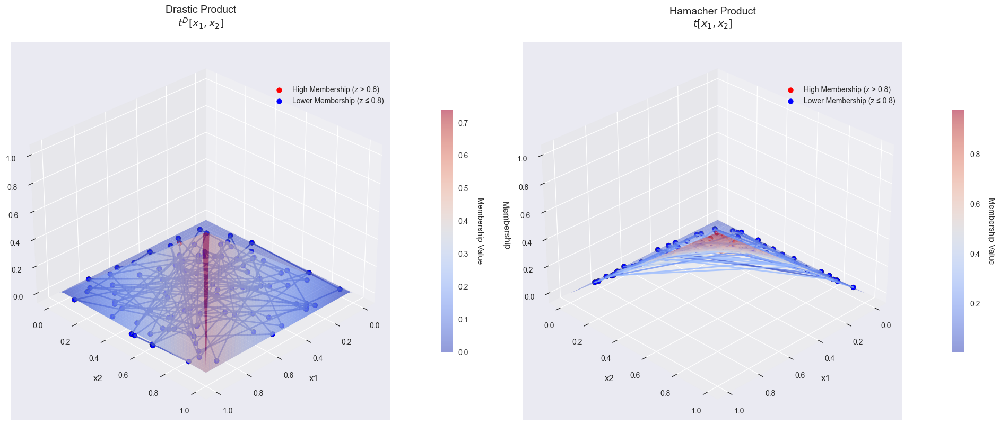

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

# Drastic Product and Hamacher Product from your previous query
def drastic_product(x: float, y: float) -> float:
    if max(x, y) == 1:
        return min(x, y)
    elif x < 1 and y < 1:
        return 0
    return 0

def hamacher_product(x: float, y: float) -> float:
    if x == 0 and y == 0:
        return 0
    denominator = x + y - x * y
    if denominator == 0:
        return 0
    return (x * y) / denominator

# Rest of the provided code with modifications
def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    # Since x1 needs to be in [0,1], we'll normalize it in the main function
    x1_grid = np.linspace(0, 1, points)  # After normalization
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm'] 
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def visualize_functions(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize Drastic Product and Hamacher Product in 3D space."""
    # Input validation
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 10), dpi=100)
    
    # Normalize x1 to [0,1] for both A and B since Drastic and Hamacher expect inputs in [0,1]
    x1_A_raw = np.array([a[0] for a in A])
    x1_A = (x1_A_raw - min(x1_A_raw)) / (max(x1_A_raw) - min(x1_A_raw))  # Normalize to [0,1]
    x2_A = np.array([a[1] for a in A])
    
    # Calculate Drastic Product for data points
    z_A = np.array([drastic_product(x1_A[i], x2_A[i]) for i in range(len(x1_A))])
    
    # Create grid for surface
    X1_A, X2_A = create_grid(x1_A, x2_A)
    # Calculate Drastic Product for the grid
    Z_A = np.zeros_like(X1_A)
    for i in range(X1_A.shape[0]):
        for j in range(X1_A.shape[1]):
            Z_A[i, j] = drastic_product(X1_A[i, j], X2_A[i, j])
    
    ax1 = fig.add_subplot(121, projection='3d')
    surf_A, _ = plot_function(
        ax1, x1_A, x2_A, z_A, X1_A, X2_A, Z_A,
        'Drastic Product\n$t^D[x_1, x_2]$'
    )
    
    cbar1 = fig.colorbar(surf_A, ax=ax1, shrink=0.5, pad=0.1)
    cbar1.set_label('Membership Value', rotation=270, labelpad=20)
    
    # Normalize x1 for B
    x1_B_raw = np.array([b[0] for b in B])
    x1_B = (x1_B_raw - min(x1_B_raw)) / (max(x1_B_raw) - min(x1_B_raw))  # Normalize to [0,1]
    x2_B = np.array([b[1] for b in B])
    
    # Calculate Hamacher Product for data points
    z_B = np.array([hamacher_product(x1_B[i], x2_B[i]) for i in range(len(x1_B))])
    
    # Create grid for surface
    X1_B, X2_B = create_grid(x1_B, x2_B)
    # Calculate Hamacher Product for the grid
    Z_B = np.zeros_like(X1_B)
    for i in range(X1_B.shape[0]):
        for j in range(X1_B.shape[1]):
            Z_B[i, j] = hamacher_product(X1_B[i, j], X2_B[i, j])
    
    ax2 = fig.add_subplot(122, projection='3d')
    surf_B, _ = plot_function(
        ax2, x1_B, x2_B, z_B, X1_B, X2_B, Z_B,
        'Hamacher Product\n$t[x_1, x_2]$'
    )
    
    cbar2 = fig.colorbar(surf_B, ax=ax2, shrink=0.5, pad=0.1)
    cbar2.set_label('Membership Value', rotation=270, labelpad=20)
    
    for ax in [ax1, ax2]:
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('membership_function_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_functions(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

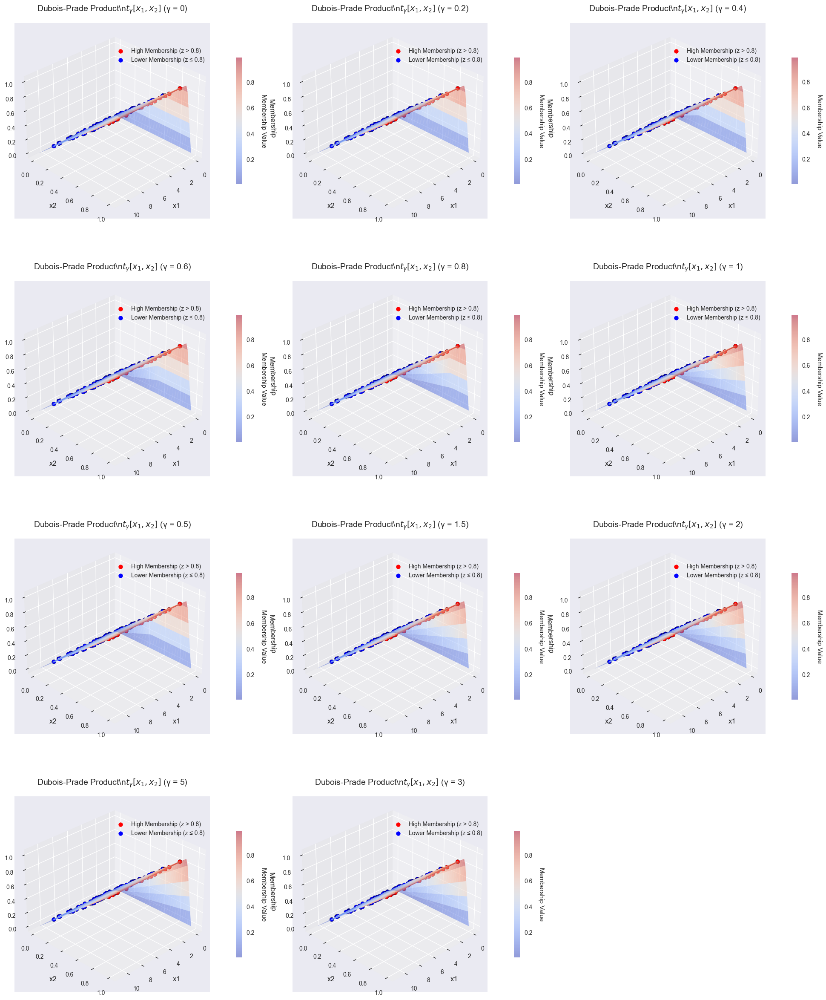

C:\Users\ndz13\AppData\Local\Temp\ipykernel_2312\3666258419.py:19: RuntimeWarning: invalid value encountered in scalar power
  term = ((1 - x)**sigma + (1 - y)**sigma)**(1/sigma)


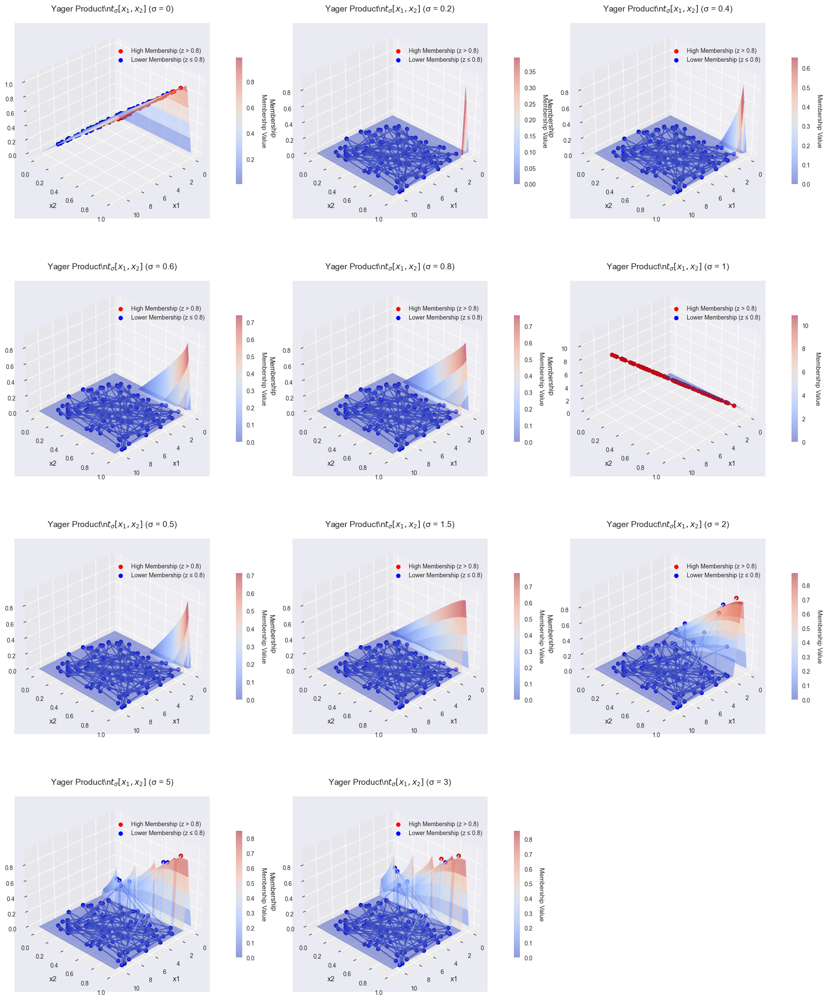

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

# Dubois-Prade and Yager functions
def dubois_prade(x: float, y: float, gamma: float) -> float:
    gamma = np.clip(gamma, 0, 1)  # Clip gamma to [0, 1] for consistency
    denominator = max(x, y, gamma)
    if denominator == 0:
        return 0
    return (x * y) / denominator

def yager(x: float, y: float, sigma: float) -> float:
    sigma = np.clip(sigma, 0, 5)  # Clip sigma to [0, 5] for stability
    if sigma == 0:
        return min(x, y)  # Limit as sigma approaches 0
    term = ((1 - x)**sigma + (1 - y)**sigma)**(1/sigma)
    return 1 - min(1, term)

# Validation and grid functions
def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm'] 
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    point_colors = np.where(z > 0.8, 'red', 'blue')
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    ax.view_init(elev=30, azim=45)
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def visualize_dubois_prade(A: List[Tuple[float, float]]) -> None:
    """Visualize Dubois-Prade function for all gamma values."""
    validate_input(A)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 25), dpi=100)
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    values = [0, 0.2, 0.4, 0.6, 0.8, 1, 0.5, 1.5, 2, 5, 3]
    
    for idx, gamma in enumerate(values):
        ax = fig.add_subplot(4, 3, idx + 1, projection='3d')
        X1, X2 = create_grid(x1_A, x2_A)
        Z = np.zeros_like(X1)
        for i in range(X1.shape[0]):
            for j in range(X1.shape[1]):
                Z[i, j] = dubois_prade(X1[i, j], X2[i, j], gamma)
        z_A = np.array([dubois_prade(x1_A[i], x2_A[i], gamma) for i in range(len(x1_A))])
        surf_A, _ = plot_function(
            ax, x1_A, x2_A, z_A, X1, X2, Z,
            r'Dubois-Prade Product\n$t_\gamma[x_1, x_2]$ (γ = {})'.format(gamma)
        )
        cbar = fig.colorbar(surf_A, ax=ax, shrink=0.5, pad=0.1)
        cbar.set_label('Membership Value', rotation=270, labelpad=20)
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('dubois_prade_all_gamma.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_yager(B: List[Tuple[float, float]]) -> None:
    """Visualize Yager function for all sigma values."""
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 25), dpi=100)
    
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    values = [0, 0.2, 0.4, 0.6, 0.8, 1, 0.5, 1.5, 2, 5, 3]
    
    for idx, sigma in enumerate(values):
        ax = fig.add_subplot(4, 3, idx + 1, projection='3d')
        X1, X2 = create_grid(x1_B, x2_B)
        Z = np.zeros_like(X1)
        for i in range(X1.shape[0]):
            for j in range(X1.shape[1]):
                Z[i, j] = yager(X1[i, j], X2[i, j], sigma)
        z_B = np.array([yager(x1_B[i], x2_B[i], sigma) for i in range(len(x1_B))])
        surf_B, _ = plot_function(
            ax, x1_B, x2_B, z_B, X1, X2, Z,
            r'Yager Product\n$t_\sigma[x_1, x_2]$ (σ = {})'.format(sigma)
        )
        cbar = fig.colorbar(surf_B, ax=ax, shrink=0.5, pad=0.1)
        cbar.set_label('Membership Value', rotation=270, labelpad=20)
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('yager_all_sigma.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)  
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_dubois_prade(A)
        visualize_yager(B)
    except Exception as e:
        print(f"Error: {str(e)}")

In [ ]:
#compliment of array A and B

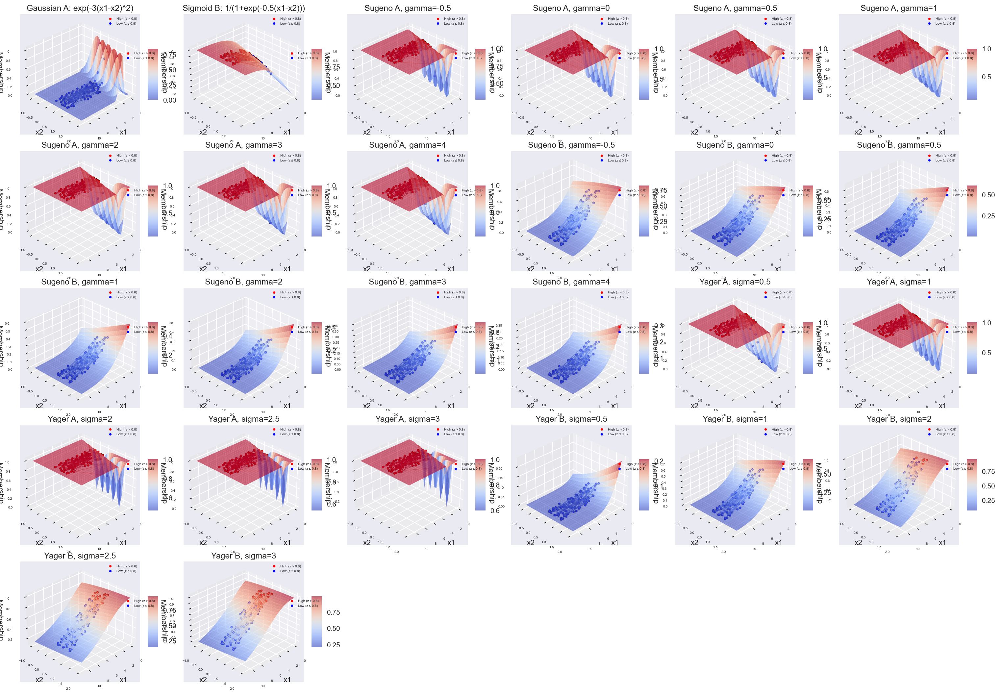

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

# Configure Matplotlib without LaTeX
plt.rcParams['text.usetex'] = False
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 6

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 25) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting with optimized points."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(min(x2) - padding, max(x2) + padding, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm']
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.6, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=10, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=0.5, alpha=0.8)
    
    ax.set_xlabel('x1', labelpad=2)
    ax.set_ylabel('x2', labelpad=2)
    ax.set_zlabel('Membership', labelpad=2)
    ax.set_title(title, pad=5)
    
    ax.view_init(elev=30, azim=45)
    ax.tick_params(axis='both', which='major', labelsize=5)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def visualize_functions(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize Gaussian, Sigmoid, and their Sugeno and Yager complements in 3D."""
    # Input validation
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 14), dpi=150)
    
    # Parameters
    gamma_values = [-0.5, 0, 0.5, 1, 2, 3, 4]  # Sugeno
    sigma_values = [0.5, 1, 2, 2.5, 3]  # Yager
    
    # Original data for A
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    z_A = np.exp(-3 * (x1_A - x2_A)**2)
    X1_A, X2_A = create_grid(x1_A, x2_A)
    Z_A = np.exp(-3 * (X1_A - X2_A)**2)
    
    # Original data for B
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    z_B = 1 / (1 + np.exp(-0.5 * (x1_B - x2_B)))
    X1_B, X2_B = create_grid(x1_B, x2_B)
    Z_B = 1 / (1 + np.exp(-0.5 * (X1_B - X2_B)))
    
    # Compute complements
    sugeno_A = {gamma: (1 - Z_A) / (1 + gamma * Z_A) for gamma in gamma_values}
    sugeno_B = {gamma: (1 - Z_B) / (1 + gamma * Z_B) for gamma in gamma_values}
    yager_A = {sigma: (1 - Z_A**sigma)**(1/sigma) for sigma in sigma_values}
    yager_B = {sigma: (1 - Z_B**sigma)**(1/sigma) for sigma in sigma_values}
    
    # Plot original Gaussian (A)
    ax1 = fig.add_subplot(5, 6, 1, projection='3d')
    surf_A, scatter_A = plot_function(
        ax1, x1_A, x2_A, z_A, X1_A, X2_A, Z_A,
        'Gaussian A: exp(-3(x1-x2)^2)'
    )
    fig.colorbar(surf_A, ax=ax1, shrink=0.4, aspect=5)
    
    # Plot original Sigmoid (B)
    ax2 = fig.add_subplot(5, 6, 2, projection='3d')
    surf_B, scatter_B = plot_function(
        ax2, x1_B, x2_B, z_B, X1_B, X2_B, Z_B,
        'Sigmoid B: 1/(1+exp(-0.5(x1-x2)))'
    )
    fig.colorbar(surf_B, ax=ax2, shrink=0.4, aspect=5)
    
    # Plot Sugeno A
    for idx, gamma in enumerate(gamma_values, 3):
        ax = fig.add_subplot(5, 6, idx, projection='3d')
        z_sugeno_A = (1 - z_A) / (1 + gamma * z_A)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_sugeno_A, X1_A, X2_A, sugeno_A[gamma],
            f'Sugeno A, gamma={gamma}'
        )
        fig.colorbar(surf, ax=ax, shrink=0.4, aspect=5)
    
    # Plot Sugeno B
    for idx, gamma in enumerate(gamma_values, 10):
        ax = fig.add_subplot(5, 6, idx, projection='3d')
        z_sugeno_B = (1 - z_B) / (1 + gamma * z_B)
        surf, _ = plot_function(
            ax, x1_B, x2_B, z_sugeno_B, X1_B, X2_B, sugeno_B[gamma],
            f'Sugeno B, gamma={gamma}'
        )
        fig.colorbar(surf, ax=ax, shrink=0.4, aspect=5)
    
    # Plot Yager A
    for idx, sigma in enumerate(sigma_values, 17):
        ax = fig.add_subplot(5, 6, idx, projection='3d')
        z_yager_A = (1 - z_A**sigma)**(1/sigma)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_yager_A, X1_A, X2_A, yager_A[sigma],
            f'Yager A, sigma={sigma}'
        )
        fig.colorbar(surf, ax=ax, shrink=0.4, aspect=5)
    
    # Plot Yager B
    for idx, sigma in enumerate(sigma_values, 22):
        ax = fig.add_subplot(5, 6, idx, projection='3d')
        z_yager_B = (1 - z_B**sigma)**(1/sigma)
        surf, _ = plot_function(
            ax, x1_B, x2_B, z_yager_B, X1_B, X2_B, yager_B[sigma],
            f'Yager B, sigma={sigma}'
        )
        fig.colorbar(surf, ax=ax, shrink=0.4, aspect=5)
    
    # Add legend for scatter points
    for ax in fig.get_axes():
        ax.scatter([], [], c='red', label='High (z > 0.8)', s=10)
        ax.scatter([], [], c='blue', label='Low (z ≤ 0.8)', s=10)
        ax.legend(loc='upper right', fontsize=5)
    
    plt.tight_layout(pad=1.0)
    plt.savefig('all_membership_complement_3d_no_latex.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_functions(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

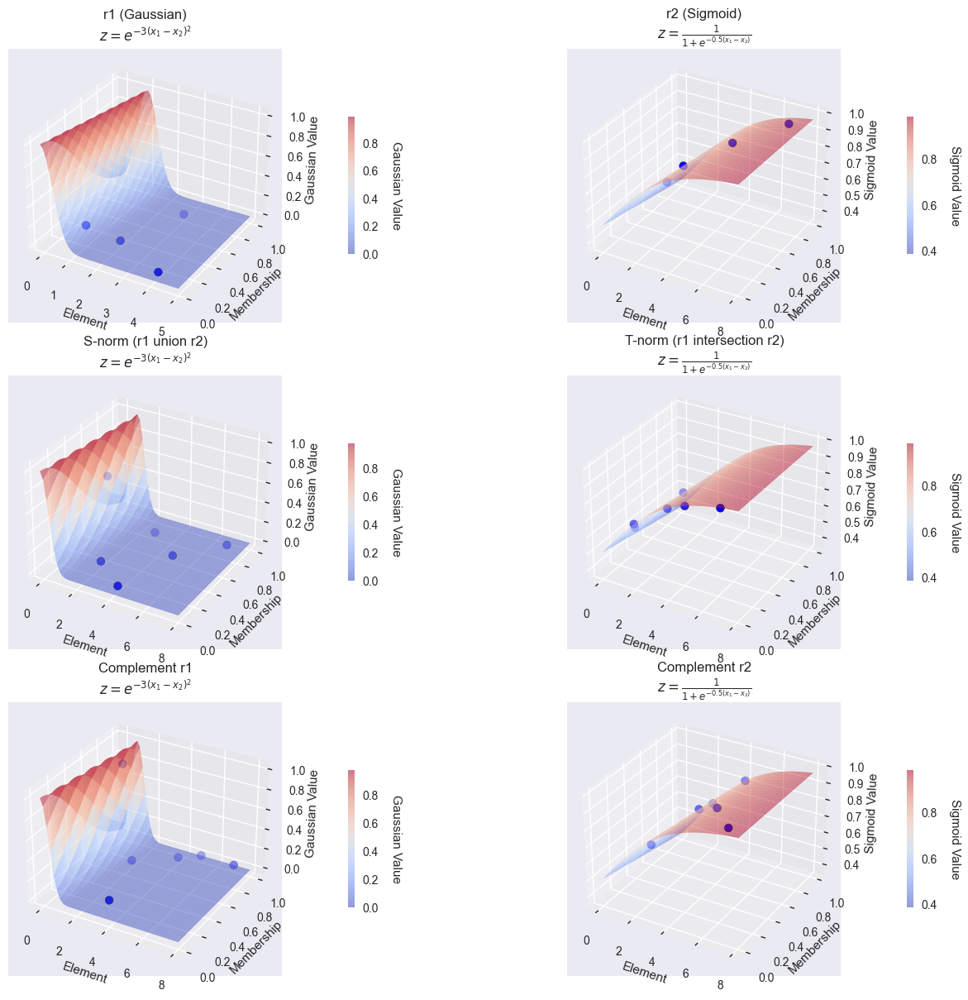

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define the fuzzy relations
r1 = {1: 0.2, 2: 0.3, 3: 0.8, 4: 0.1}
r2 = {1: 0.6, 3: 0.4, 5: 0.6, 7: 0.9}

# Universe of discourse
universe = [1, 2, 3, 4, 5, 7]

# Compute S-norm, T-norm, and complements
s_norm = {x: max(r1.get(x, 0), r2.get(x, 0)) for x in universe}
t_norm = {x: min(r1.get(x, 0), r2.get(x, 0)) for x in universe}
comp_r1 = {x: 1 - r1.get(x, 0) for x in universe}
comp_r2 = {x: 1 - r2.get(x, 0) for x in universe}

# Prepare data for plotting
sets = [
    (r1, 'r1 (Gaussian)', 'gaussian'),
    (r2, 'r2 (Sigmoid)', 'sigmoid'),
    (s_norm, 'S-norm (r1 union r2)', 'gaussian'),
    (t_norm, 'T-norm (r1 intersection r2)', 'sigmoid'),
    (comp_r1, 'Complement r1', 'gaussian'),
    (comp_r2, 'Complement r2', 'sigmoid')
]

# Create mesh grid for surface
def create_grid(x1, padding=1.0, points=50):
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

# Plotting
plt.style.use('seaborn-v0_8')
fig = plt.figure(figsize=(15, 12))

for i, (fuzzy_set, title, func_type) in enumerate(sets):
    ax = fig.add_subplot(3, 2, i+1, projection='3d')
    
    # Extract x1 (elements) and x2 (memberships)
    x1 = np.array(list(fuzzy_set.keys()))
    x2 = np.array([fuzzy_set[x] for x in x1])
    
    # Compute z based on function type
    if func_type == 'gaussian':
        z = np.exp(-3 * (x1 - x2)**2)
        z_label = 'Gaussian Value'
        title += '\n$z = e^{-3(x_1 - x_2)^2}$'
    else:  # sigmoid
        z = 1 / (1 + np.exp(-0.5 * (x1 - x2)))
        z_label = 'Sigmoid Value'
        title += '\n$z = \\frac{1}{1 + e^{-0.5(x_1 - x_2)}}$'
    
    # Create grid for surface
    X1, X2 = create_grid(x1)
    if func_type == 'gaussian':
        Z = np.exp(-3 * (X1 - X2)**2)
    else:
        Z = 1 / (1 + np.exp(-0.5 * (X1 - X2)))
    
    # Plot surface
    surf = ax.plot_surface(X1, X2, Z, cmap='coolwarm', alpha=0.5)
    
    # Plot scatter points
    ax.scatter(x1, x2, z, c='blue', s=50, edgecolor='k')
    
    # Labels and title
    ax.set_xlabel('Element')
    ax.set_ylabel('Membership')
    ax.set_zlabel(z_label)
    ax.set_title(title)
    
    # Colorbar
    cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.1)
    cbar.set_label(z_label, rotation=270, labelpad=20)

# Set font to support mathematical symbols
plt.rcParams['font.family'] = 'DejaVu Sans'

plt.tight_layout()
plt.savefig('fuzzy_relations_3d.png')
plt.show()

In [ ]:
#EXCERSISE 4

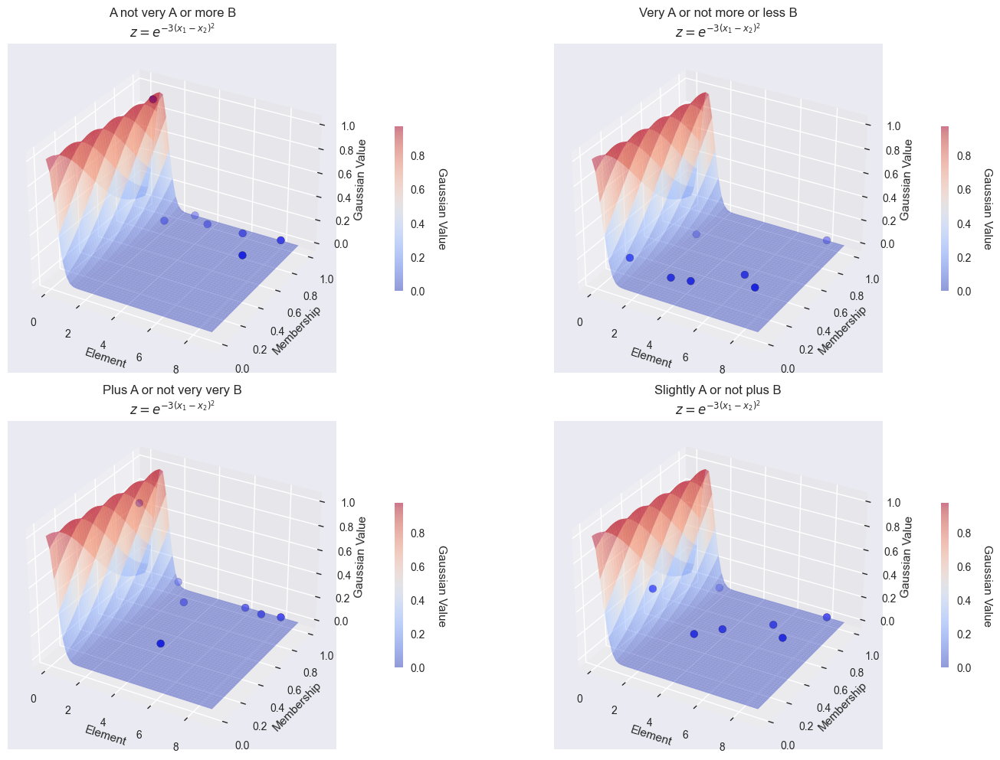

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define the fuzzy sets
A = {1: 0.3, 2: 0.4, 4: 0.5, 6: 0.2, 7: 0.5, 8: 1.0}
B = {1: 0.7, 2: 0.1, 3: 0.6, 4: 0.9, 6: 0.3, 7: 0.4}

# Universe of discourse
universe = [1, 2, 3, 4, 6, 7, 8]

# Compute fuzzy operations
# 1. A not very A or more B
very_A = {x: A.get(x, 0)**2 for x in universe}
not_very_A = {x: 1 - very_A[x] for x in universe}
more_B = {x: B.get(x, 0)**0.5 for x in universe}
set1 = {x: max(A.get(x, 0), not_very_A[x], more_B[x]) for x in universe}

# 2. Very A or not more or less B
not_more_less_B = {x: 1 - more_B[x] for x in universe}
set2 = {x: max(very_A[x], not_more_less_B[x]) for x in universe}

# 3. Plus A or not very very B
plus_A = {x: A.get(x, 0)**1.25 for x in universe}
very_very_B = {x: B.get(x, 0)**4 for x in universe}
not_very_very_B = {x: 1 - very_very_B[x] for x in universe}
set3 = {x: max(plus_A[x], not_very_very_B[x]) for x in universe}

# 4. Slightly A or not plus B
slightly_A = {x: A.get(x, 0)**0.75 for x in universe}
plus_B = {x: B.get(x, 0)**1.25 for x in universe}
not_plus_B = {x: 1 - plus_B[x] for x in universe}
set4 = {x: max(slightly_A[x], not_plus_B[x]) for x in universe}

# Prepare data for plotting
sets = [
    (set1, 'A not very A or more B', 'gaussian'),
    (set2, 'Very A or not more or less B', 'gaussian'),
    (set3, 'Plus A or not very very B', 'gaussian'),
    (set4, 'Slightly A or not plus B', 'gaussian')
]

# Create mesh grid for surface
def create_grid(x1, padding=1.0, points=50):
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

# Plotting
plt.style.use('seaborn-v0_8')
fig = plt.figure(figsize=(15, 10))

for i, (fuzzy_set, title, func_type) in enumerate(sets):
    ax = fig.add_subplot(2, 2, i+1, projection='3d')
    
    # Extract x1 (elements) and x2 (memberships)
    x1 = np.array(list(fuzzy_set.keys()))
    x2 = np.array([fuzzy_set[x] for x in x1])
    
    # Compute z (Gaussian)
    z = np.exp(-3 * (x1 - x2)**2)
    z_label = 'Gaussian Value'
    title += '\n$z = e^{-3(x_1 - x_2)^2}$'
    
    # Create grid for surface
    X1, X2 = create_grid(x1)
    Z = np.exp(-3 * (X1 - X2)**2)
    
    # Plot surface
    surf = ax.plot_surface(X1, X2, Z, cmap='coolwarm', alpha=0.5)
    
    # Plot scatter points
    ax.scatter(x1, x2, z, c='blue', s=50, edgecolor='k')
    
    # Labels and title
    ax.set_xlabel('Element')
    ax.set_ylabel('Membership')
    ax.set_zlabel(z_label)
    ax.set_title(title)
    
    # Colorbar
    cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.1)
    cbar.set_label(z_label, rotation=270, labelpad=20)

# Set font to support mathematical symbols
plt.rcParams['font.family'] = 'DejaVu Sans'

plt.tight_layout()
plt.savefig('fuzzy_operations_3d.png')
plt.show()

In [ ]:
Step 1: Define Fuzzy Set Operations and Calculations

In fuzzy logic, modifiers like "very," "more or less," "plus," and "slightly" adjust membership values, and logical operations like "not" and "or" combine fuzzy sets. Below, we define these operations and compute the resulting fuzzy sets for the following expressions.

Fuzzy Sets:
- A = {(1, 0.3), (2, 0.4), (4, 0.5), (6, 0.2), (7, 0.0), (7, 0.5), (8, 1.0)}
- B = {(1, 0.7), (2, 0.1), (3, 0.6), (4, 0.9), (6, 0.3), (7, 0.4)}

Universe of Discourse: U = {1, 2, 3, 4, 6, 7, 8}

Expressions to Compute:
1. A not very A or more B
2. very A or not more or less B
3. plus A or not very very B
4. slightly A or not plus B

Fuzzy Set Operation Definitions

1. Not Operation
   Equation: mu_{neg A}(x) = 1 - mu_A(x)
   Explanation: The "Not" operation computes the complement of a fuzzy set A by subtracting its membership value of each element x from 1.0. This represents the degree to which x does not belong to A.

2. Or Operation (S-norm)
   Equation: mu_{A U B}(x) = max(mu_A(x), mu_B(x))
   Explanation: The "Or" operation, or S-norm, computes the union of two fuzzy sets A and B by taking the maximum of their membership values for each element x. This represents the degree to which x belongs to at least one of A or B.

3. Very Operation
   Equation: mu_{very A}(x) = (mu_A(x))^2
   Explanation: The "Very" operation concentrates the fuzzy set A by squaring the membership value of each element x. This reduces smaller membership values more significantly, emphasizing elements with stronger membership.

4. More or Less Operation
   Equation: mu_{more or less A}(x) = sqrt(mu_A(x)) = (mu_A(x))^(0.5)
   Explanation: The "More or less" operation dilutes the fuzzy set A by squaring the root of the membership value of each element x. This increases smaller membership values and reduces larger ones, making the set broader.

5. Plus Operation
   Equation: mu_{plus A}(x) = (mu_A(x))^(1.25)
   Explanation: The "Plus" operation slightly concentrates the fuzzy set A by raising the membership value of each element x to the power of 1.25. This is less intense than the "Very" operation.

6. Slightly Operation
   Equation: mu_{slightly A}(x) = (mu_A(x))^(0.75)
   Explanation: The "Slightly" operation slightly dilutes the fuzzy set A by raising the membership value of each element x by the power of 0.75. This is less intense than the "More or less" operation.

7. Very Very Operation
   Equation: mu_{very very A}(x) = (mu_A(x))^4
   Explanation: The "Very very" operation strongly concentrates the fuzzy set A by raising the membership value of each element x to the power of 4.0. This is an intensification of the "Very" operation.

Fuzzy Set Calculations

Fuzzy Set A:
mu_A(1) = 0.3, mu_A(2) = 0.4, mu_A(3) = 0, mu_A(4) = 0.5, mu_A(6) = 0.2, mu_A(7) = 0.5, mu_A(8) = 1.0

Fuzzy Set B:
mu_B(1) = 0.7, mu_B(2) = 0.1, mu_B(3) = 0.6, mu_B(4) = 0.9, mu_B(6) = 0.3, mu_B(7) = 0.4, mu_B(8) = 0

1. A not very A or more B

   Very A:
   mu_{very A}(x) = (mu_A(x))^2
   - x = 1: (0.3)^2 = 0.09
   - x = 2: (0.4)^2 = 0.16
   - x = 3: (0)^2 = 0
   - x = 4: (0.5)^2 = 0.25
   - x = 6: (0.2)^2 = 0.04
   - x = 7: (0.5)^2 = 0.25
   - x = 8: (1.0)^2 = 1.0
   very A = {(1, 0.09), (2, 0.16), (4, 0.25), (6, 0.04), (7, 0.25), (8, 1.0)}

   Not Very A:
   mu_{neg very A}(x) = 1 - mu_{very A}(x)
   - x = 1: 1 - 0.09 = 0.91
   - x = 2: 1 - 0.16 = 0.84
   - x = 3: 1 - 0 = 1.0
   - x = 4: 1 - 0.25 = 0.75
   - x = 6: 1 - 0.04 = 0.96
   - x = 7: 1 - 0.25 = 0.75
   - x = 8: 1 - 1.0 = 0.0
   neg very A = {(1, 0.91), (2, 0.84), (3, 1.0), (4, 0.75), (6, 0.96), (7, 0.75), (8, 0.0)}

   More B (More or Less):
   mu_{more B}(x) = (mu_B(x))^(0.5)
   - x = 1: (0.7)^(0.5) ≈ 0.8367
   - x = 2: (0.1)^(0.5) ≈ 0.3162
   - x = 3: (0.6)^(0.5) ≈ 0.7746
   - x = 4: (0.9)^(0.5) ≈ 0.9487
   - x = 6: (0.3)^(0.5) ≈ 0.5477
   - x = 7: (0.4)^(0.5) ≈ 0.6325
   - x = 8: (0)^(0.5) = 0
   more B = {(1, 0.8367), (2, 0.3162), (3, 0.7746), (4, 0.9487), (6, 0.5477), (7, 0.6325), (8, 0.0)}

   A not very A or more B:
   mu(x) = max(mu_A(x), mu_{neg very A}(x), mu_{more B}(x))
   - x = 1: max(0.3, 0.91, 0.8367) = 0.91
   - x = 2: max(0.4, 0.84, 0.3162) = 0.84
   - x = 3: max(0, 1.0, 0.7746) = 1.0
   - x = 4: max(0.5, 0.75, 0.9487) = 0.9487
   - x = 6: max(0.2, 0.96, 0.5477) = 0.96
   - x = 7: max(0.5, 0.75, 0.6325) = 0.75
   - x = 8: max(1.0, 0.0, 0.0) = 1.0
   Result = {(1, 0.91), (2, 0.84), (3, 1.0), (4, 0.9487), (6, 0.96), (7, 0.75), (8, 1.0)}

2. very A or not more or less B

   Very A:
   (Already computed)
   very A = {(1, 0.09), (2, 0.16), (4, 0.25), (6, 0.04), (7, 0.25), (8, 1.0)}

   More or Less B:
   (Same as More B)
   more or less B = {(1, 0.8367), (2, 0.3162), (3, 0.7746), (4, 0.9487), (6, 0.5477), (7, 0.6325), (8, 0.0)}

   Not More or Less B:
   mu_{neg more or less B}(x) = 1 - mu_{more or less B}(x)
   - x = 1: 1 - 0.8367 ≈ 0.1633
   - x = 2: 1 - 0.3162 ≈ 0.6838
   - x = 3: 1 - 0.7746 ≈ 0.2254
   - x = 4: 1 - 0.9487 ≈ 0.0513
   - x = 6: 1 - 0.5477 ≈ 0.4523
   - x = 7: 1 - 0.6325 ≈ 0.3675
   - x = 8: 1 - 0.0 = 1.0
   neg more or less B = {(1, 0.1633), (2, 0.6838), (3, 0.2254), (4, 0.0513), (6, 0.4523), (7, 0.3675), (8, 1.0)}

   very A or not more or less B:
   mu(x) = max(mu_{very A}(x), mu_{neg more or less B}(x))
   - x = 1: max(0.09, 0.1633) = 0.1633
   - x = 2: max(0.16, 0.6838) = 0.6838
   - x = 3: max(0, 0.2254) = 0.2254
   - x = 4: max(0.25, 0.0513) = 0.25
   - x = 6: max(0.04, 0.4523) = 0.4523
   - x = 7: max(0.25, 0.3675) = 0.3675
   - x = 8: max(1.0, 1.0) = 1.0
   Result = {(1, 0.1633), (2, 0.6838), (3, 0.2254), (4, 0.25), (6, 0.4523), (7, 0.3675), (8, 1.0)}

3. plus A or not very very B

   Plus A:
   mu_{plus A}(x) = (mu_A(x))^(1.25)
   - x = 1: (0.3)^(1.25) ≈ 0.2307
   - x = 2: (0.4)^(1.25) ≈ 0.3354
   - x = 3: (0)^(1.25) = 0
   - x = 4: (0.5)^(1.25) ≈ 0.4353
   - x = 6: (0.2)^(1.25) ≈ 0.1393
   - x = 7: (0.5)^(1.25) ≈ 0.4353
   - x = 8: (1.0)^(1.25) = 1.0
   plus A = {(1, 0.2307), (2, 0.3354), (4, 0.4353), (6, 0.1393), (7, 0.4353), (8, 1.0)}

   Very Very B:
   mu_{very very B}(x) = (mu_B(x))^4
   - x = 1: (0.7)^4 ≈ 0.2401
   - x = 2: (0.1)^4 = 0.0001
   - x = 3: (0.6)^4 ≈ 0.1296
   - x = 4: (0.9)^4 ≈ 0.6561
   - x = 6: (0.3)^4 ≈ 0.0081
   - x = 7: (0.4)^4 ≈ 0.0256
   - x = 8: (0)^4 = 0
   very very B = {(1, 0.2401), (2, 0.0001), (3, 0.1296), (4, 0.6561), (6, 0.0081), (7, 0.0256), (8, 0.0)}

   Not Very Very B:
   mu_{neg very very B}(x) = 1 - mu_{very very B}(x)
   - x = 1: 1 - 0.2401 ≈ 0.7599
   - x = 2: 1 - 0.0001 ≈ 0.9999
   - x = 3: 1 - 0.1296 ≈ 0.8704
   - x = 4: 1 - 0.6561 ≈ 0.3439
   - x = 6: 1 - 0.0081 ≈ 0.9919
   - x = 7: 1 - 0.0256 ≈ 0.9744
   - x = 8: 1 - 0.0 = 1.0
   neg very very B = {(1, 0.7599), (2, 0.9999), (3, 0.8704), (4, 0.3439), (6, 0.9919), (7, 0.9744), (8, 1.0)}

   plus A or not very very B:
   mu(x) = max(mu_{plus A}(x), mu_{neg very very B}(x))
   - x = 1: max(0.2307, 0.7599) = 0.7599
   - x = 2: max(0.3354, 0.9999) = 0.9999
   - x = 3: max(0, 0.8704) = 0.8704
   - x = 4: max(0.4353, 0.3439) = 0.4353
   - x = 6: max(0.1393, 0.9919) = 0.9919
   - x = 7: max(0.4353, 0.9744) = 0.9744
   - x = 8: max(1.0, 1.0) = 1.0
   Result = {(1, 0.7599), (2, 0.9999), (3, 0.8704), (4, 0.4353), (6, 0.9919), (7, 0.9744), (8, 1.0)}

4. slightly A or not plus B

   Slightly A:
   mu_{slightly A}(x) = (mu_A(x))^(0.75)
   - x = 1: (0.3)^(0.75) ≈ 0.4547
   - x = 2: (0.4)^(0.75) ≈ 0.5477
   - x = 3: (0)^(0.75) = 0
   - x = 4: (0.5)^(0.75) ≈ 0.6310
   - x = 6: (0.2)^(0.75) ≈ 0.3473
   - x = 7: (0.5)^(0.75) ≈ 0.6310
   - x = 8: (1.0)^(0.75) = 1.0
   slightly A = {(1, 0.4547), (2, 0.5477), (4, 0.6310), (6, 0.3473), (7, 0.6310), (8, 1.0)}

   Plus B:
   mu_{plus B}(x) = (mu_B(x))^(1.25)
   - x = 1: (0.7)^(1.25) ≈ 0.6356
   - x = 2: (0.1)^(1.25) ≈ 0.0562
   - x = 3: (0.6)^(1.25) ≈ 0.4977
   - x = 4: (0.9)^(1.25) ≈ 0.8847
   - x = 6: (0.3)^(1.25) ≈ 0.2307
   - x = 7: (0.4)^(1.25) ≈ 0.3354
   - x = 8: (0)^(1.25) = 0
   plus B = {(1, 0.6356), (2, 0.0562), (3, 0.4977), (4, 0.8847), (6, 0.2307), (7, 0.3354), (8, 0.0)}

   Not Plus B:
   mu_{neg plus B}(x) = 1 - mu_{plus B}(x)
   - x = 1: 1 - 0.6356 ≈ 0.3644
   - x = 2: 1 - 0.0562 ≈ 0.9438
   - x = 3: 1 - 0.4977 ≈ 0.5023
   - x = 4: 1 - 0.8847 ≈ 0.1153
   - x = 6: 1 - 0.2307 ≈ 0.7693
   - x = 7: 1 - 0.3354 ≈ 0.6646
   - x = 8: 1 - 0.0 = 1.0
   neg plus B = {(1, 0.3644), (2, 0.9438), (3, 0.5023), (4, 0.1153), (6, 0.7693), (7, 0.6646), (8, 1.0)}

   slightly A or not plus B:
   mu(x) = max(mu_{slightly A}(x), mu_{neg plus B}(x))
   - x = 1: max(0.4547, 0.3644) = 0.4547
   - x = 2: max(0.5477, 0.9438) = 0.9438
   - x = 3: max(0, 0.5023) = 0.5023
   - x = 4: max(0.6310, 0.1153) = 0.6310
   - x = 6: max(0.3473, 0.7693) = 0.7693
   - x = 7: max(0.6310, 0.6646) = 0.6646
   - x = 8: max(1.0, 1.0) = 1.0
   Result = {(1, 0.4547), (2, 0.9438), (3, 0.5023), (4, 0.6310), (6, 0.7693), (7, 0.6646), (8, 1.0)}

In [7]:
#excercise 5

   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ----- ---------------------------------- 0.3/1.8 MB ? eta -:--:--
   ----- ---------------------------------- 0.3/1.8 MB ? eta -:--:--
   ----- ---------------------------------- 0.3/1.8 MB ? eta -:--:--
   ----------- ---------------------------- 0.5/1.8 MB 577.4 kB/s eta 0:00:03
   ----------------- ---------------------- 0.8/1.8 MB 644.9 kB/s eta 0:00:02
   ----------------- ---------------------- 0.8/1.8 MB 644.9 kB/s eta 0:00:02
   ---------------------- ----------------- 1.0/1.8 MB 708.5 kB/s eta 0:00:02
   ---------------------- ----------------- 1.0/1.8 MB 708.5 kB/s eta 0:00:02
   ---------------------------- ----------- 1.3/1.8 MB 684.4 kB/s eta 0:00:01
   ---------------------------- ----------- 1.3/1.8 MB 684.4 kB/s eta 0:00:01
   ---------------------------------- --


[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: To modify pip, please run the following command:
C:\Users\ndz13\AppData\Local\Programs\Python\Python312\python.exe -m pip install --upgrade pip


Generated Data (X, y):



[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


,x,y
0,-1.570796,-0.917152
1,-1.539063,-0.911963
2,-1.507330,-0.906464
3,-1.475597,-0.900640
4,-1.443863,-0.894473
...,...,...
95,1.443863,0.894473
96,1.475597,0.900640
97,1.507330,0.906464
98,1.539063,0.911963


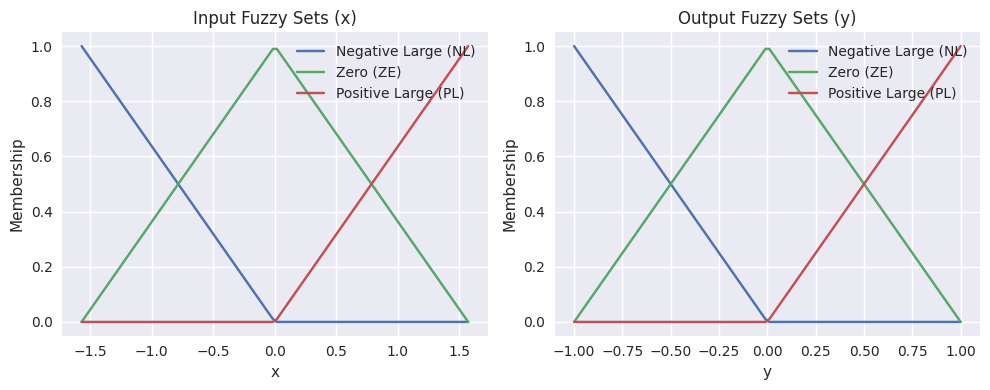

MSE with 3 rules: 0.185223


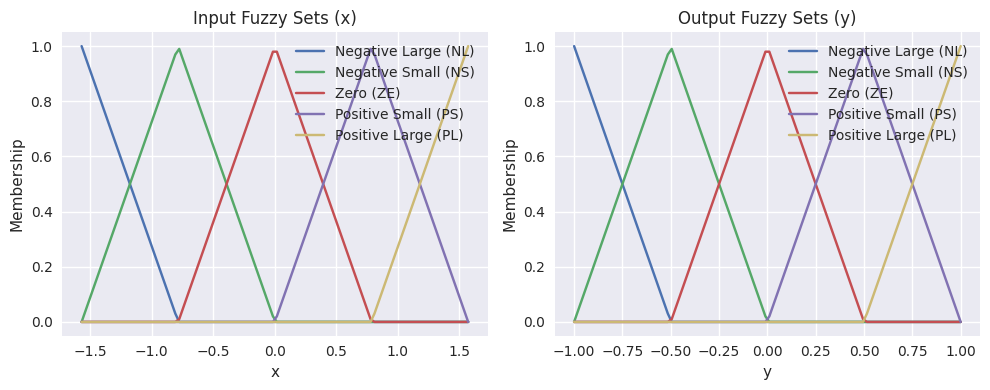

MSE with 5 rules: 0.033208

Result Table:


,x,Fuzzy Output,Actual tanh(x),Squared Error
0,-1.570796,-0.833232,-0.917152,0.007043
1,-1.539063,-0.790085,-0.911963,0.014854
2,-1.507330,-0.753606,-0.906464,0.023366
3,-1.475597,-0.722321,-0.900640,0.031797
4,-1.443863,-0.695173,-0.894473,0.039720
...,...,...,...,...
95,1.443863,0.695173,0.894473,0.039720
96,1.475597,0.722321,0.900640,0.031797
97,1.507330,0.753606,0.906464,0.023366
98,1.539063,0.790085,0.911963,0.014854



MSE Table:


,Number of Rules,MSE
0,3,0.185223
1,5,0.033208


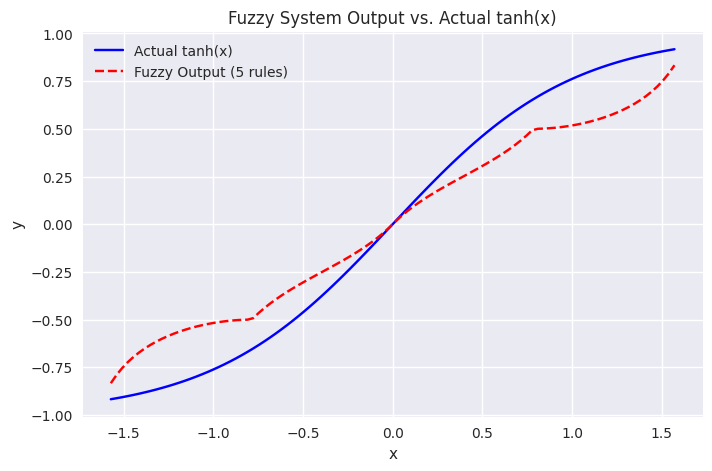

In [13]:
# Cell 1: Install and upgrade dependencies
!pip install --upgrade pip
!pip install numpy scikit-fuzzy pandas matplotlib

# Cell 2: Import libraries and generate data
import numpy as np
import pandas as pd
import skfuzzy as fuzz
import matplotlib.pyplot as plt

# Generate 100 points in [-pi/2, pi/2]
x = np.linspace(-np.pi/2, np.pi/2, 100)
y = np.tanh(x)

# Create two-column array
data = np.vstack((x, y)).T

# Display as DataFrame
df_data = pd.DataFrame(data, columns=['x', 'y'])
print("Generated Data (X, y):")
display(df_data)

# Save data to file
np.savetxt('tanh_data.txt', data, header='x y', comments='')

# Cell 3: Define linguistic variables and initial fuzzy sets (3 terms)
# Input universe: x in [-pi/2, pi/2]
x_universe = np.linspace(-np.pi/2, np.pi/2, 100)

# Output universe: y in [-1, 1]
y_universe = np.linspace(-1, 1, 100)

# Input x: NL, ZE, PL
x_nl = fuzz.trimf(x_universe, [-np.pi/2, -np.pi/2, 0])
x_ze = fuzz.trimf(x_universe, [-np.pi/2, 0, np.pi/2])
x_pl = fuzz.trimf(x_universe, [0, np.pi/2, np.pi/2])

# Output y: NL, ZE, PL
y_nl = fuzz.trimf(y_universe, [-1, -1, 0])
y_ze = fuzz.trimf(y_universe, [-1, 0, 1])
y_pl = fuzz.trimf(y_universe, [0, 1, 1])

# Plot fuzzy sets
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(x_universe, x_nl, label='Negative Large (NL)')
plt.plot(x_universe, x_ze, label='Zero (ZE)')
plt.plot(x_universe, x_pl, label='Positive Large (PL)')
plt.title('Input Fuzzy Sets (x)')
plt.xlabel('x')
plt.ylabel('Membership')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(y_universe, y_nl, label='Negative Large (NL)')
plt.plot(y_universe, y_ze, label='Zero (ZE)')
plt.plot(y_universe, y_pl, label='Positive Large (PL)')
plt.title('Output Fuzzy Sets (y)')
plt.xlabel('y')
plt.ylabel('Membership')
plt.legend()
plt.tight_layout()
plt.show()

# Cell 4: Fuzzy system with 3 rules (Mamdani, max-prod/max-min)
def fuzzy_system_3rules(x_input, x_universe, y_universe, x_nl, x_ze, x_pl, y_nl, y_ze, y_pl):
    y_outputs = []
    for x_val in x_input:
        # Fuzzify input
        nl_level = fuzz.interp_membership(x_universe, x_nl, x_val)
        ze_level = fuzz.interp_membership(x_universe, x_ze, x_val)
        pl_level = fuzz.interp_membership(x_universe, x_pl, x_val)

        # Apply rules (max-prod for implication, min for activation)
        rule1 = np.fmin(nl_level, y_nl)  # If x is NL, then y is NL
        rule2 = np.fmin(ze_level, y_ze)  # If x is ZE, then y is ZE
        rule3 = np.fmin(pl_level, y_pl)  # If x is PL, then y is PL

        # Aggregate (max)
        aggregated = np.fmax(rule1, np.fmax(rule2, rule3))

        # Defuzzify (centroid)
        y_out = fuzz.defuzz(y_universe, aggregated, 'centroid')
        y_outputs.append(y_out)
    return np.array(y_outputs)

# Compute outputs
y_pred_3rules = fuzzy_system_3rules(x, x_universe, y_universe, x_nl, x_ze, x_pl, y_nl, y_ze, y_pl)

# Compute MSE
mse_3rules = np.mean((y_pred_3rules - y) ** 2)
print(f"MSE with 3 rules: {mse_3rules:.6f}")

# Cell 5: Expand to 5 fuzzy sets and 5 rules
# Input x: NL, NS, ZE, PS, PL
x_nl = fuzz.trimf(x_universe, [-np.pi/2, -np.pi/2, -np.pi/4])
x_ns = fuzz.trimf(x_universe, [-np.pi/2, -np.pi/4, 0])
x_ze = fuzz.trimf(x_universe, [-np.pi/4, 0, np.pi/4])
x_ps = fuzz.trimf(x_universe, [0, np.pi/4, np.pi/2])
x_pl = fuzz.trimf(x_universe, [np.pi/4, np.pi/2, np.pi/2])

# Output y: NL, NS, ZE, PS, PL
y_nl = fuzz.trimf(y_universe, [-1, -1, -0.5])
y_ns = fuzz.trimf(y_universe, [-1, -0.5, 0])
y_ze = fuzz.trimf(y_universe, [-0.5, 0, 0.5])
y_ps = fuzz.trimf(y_universe, [0, 0.5, 1])
y_pl = fuzz.trimf(y_universe, [0.5, 1, 1])

# Plot expanded fuzzy sets
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(x_universe, x_nl, label='Negative Large (NL)')
plt.plot(x_universe, x_ns, label='Negative Small (NS)')
plt.plot(x_universe, x_ze, label='Zero (ZE)')
plt.plot(x_universe, x_ps, label='Positive Small (PS)')
plt.plot(x_universe, x_pl, label='Positive Large (PL)')
plt.title('Input Fuzzy Sets (x)')
plt.xlabel('x')
plt.ylabel('Membership')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(y_universe, y_nl, label='Negative Large (NL)')
plt.plot(y_universe, y_ns, label='Negative Small (NS)')
plt.plot(y_universe, y_ze, label='Zero (ZE)')
plt.plot(y_universe, y_ps, label='Positive Small (PS)')
plt.plot(y_universe, y_pl, label='Positive Large (PL)')
plt.title('Output Fuzzy Sets (y)')
plt.xlabel('y')
plt.ylabel('Membership')
plt.legend()
plt.tight_layout()
plt.show()

# Fuzzy system with 5 rules
def fuzzy_system_5rules(x_input, x_universe, y_universe, x_nl, x_ns, x_ze, x_ps, x_pl, y_nl, y_ns, y_ze, y_ps, y_pl):
    y_outputs = []
    for x_val in x_input:
        # Fuzzify input
        nl_level = fuzz.interp_membership(x_universe, x_nl, x_val)
        ns_level = fuzz.interp_membership(x_universe, x_ns, x_val)
        ze_level = fuzz.interp_membership(x_universe, x_ze, x_val)
        ps_level = fuzz.interp_membership(x_universe, x_ps, x_val)
        pl_level = fuzz.interp_membership(x_universe, x_pl, x_val)

        # Apply rules (max-prod for implication, min for activation)
        rule1 = np.fmin(nl_level, y_nl)  # If x is NL, then y is NL
        rule2 = np.fmin(ns_level, y_ns)  # If x is NS, then y is NS
        rule3 = np.fmin(ze_level, y_ze)  # If x is ZE, then y is ZE
        rule4 = np.fmin(ps_level, y_ps)  # If x is PS, then y is PS
        rule5 = np.fmin(pl_level, y_pl)  # If x is PL, then y is PL

        # Aggregate (max)
        aggregated = np.fmax(rule1, np.fmax(rule2, np.fmax(rule3, np.fmax(rule4, rule5))))

        # Defuzzify (centroid)
        y_out = fuzz.defuzz(y_universe, aggregated, 'centroid')
        y_outputs.append(y_out)
    return np.array(y_outputs)

# Compute outputs
y_pred_5rules = fuzzy_system_5rules(x, x_universe, y_universe, x_nl, x_ns, x_ze, x_ps, x_pl, y_nl, y_ns, y_ze, y_ps, y_pl)

# Compute MSE
mse_5rules = np.mean((y_pred_5rules - y) ** 2)
print(f"MSE with 5 rules: {mse_5rules:.6f}")

# Cell 6: Create result tables
# Table 1: x, fuzzy output, actual tanh(x), squared error (using 5 rules)
squared_error = (y_pred_5rules - y) ** 2
result_table = pd.DataFrame({
    'x': x,
    'Fuzzy Output': y_pred_5rules,
    'Actual tanh(x)': y,
    'Squared Error': squared_error
})
print("\nResult Table:")
display(result_table)

# Table 2: Number of rules vs. MSE
mse_table = pd.DataFrame({
    'Number of Rules': [3, 5],
    'MSE': [mse_3rules, mse_5rules]
})
print("\nMSE Table:")
display(mse_table)

# Cell 7: Plot fuzzy output vs. actual tanh(x)
plt.figure(figsize=(8, 5))
plt.plot(x, y, label='Actual tanh(x)', color='blue')
plt.plot(x, y_pred_5rules, label='Fuzzy Output (5 rules)', color='red', linestyle='--')
plt.title('Fuzzy System Output vs. Actual tanh(x)')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True)
plt.show()